## CAM-based method

In [1]:
import torch
import torch.nn as nn
from torchvision import models


from torchvision import transforms
from PIL import Image

import matplotlib.pyplot as plt
import cv2

import numpy as np
import torch.nn.functional as F

# CAM

**Question 1:** Given the following ResNet model and input image, implement an activation hook in PyTorch to extract the intermediate activations from the last convolutional layer when the model is evaluated on the given image, following the Question 3. (Part II) of Practical Session 4.
(Hint: attach the hook to the last basic block of layer4)

In [2]:
# Load a pre-trained VGG model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# use device = xla.device() if you want to use tpu.
model = models.resnet18(pretrained=True).to(device)
# Set the model to evaluation mode
model.eval()

img_path = 'data/left-dog.jpg'
input_image = Image.open(img_path)

# preprocessing for ResNet
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# set the ReLus to inplace = False
for i, (name, layer) in enumerate(model.named_modules()):
  if isinstance(layer, nn.ReLU):
    print(i, name)
    if name == "relu":
      getattr(model, name).inplace = False
    else:
      block, num, module = name.split(".")
      getattr(getattr(model,block)[int(num)], 'relu').inplace = False


# preprocess the image
input_tensor = preprocess(input_image)
# create a mini-batch as expected by the model
input_batch = input_tensor.unsqueeze(0)

################################################################################
activation = {}

def get_activation(hook_name):
    def hook(module, input, output):
        activation[hook_name] = output.detach()
    return hook

# attach the hook to a given layer and save the reference to it in "handle_activation"
layer_number = "last"
last_conv_layer = model.layer4[-1]
hook_handle = last_conv_layer.register_forward_hook(get_activation(layer_number))

# trigger the forward pass
output = model(input_batch)


last_conv_activations = activation["last"]

print(input_batch.shape)
print(last_conv_activations.shape)

/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


3 relu
9 layer1.0.relu
15 layer1.1.relu
22 layer2.0.relu
31 layer2.1.relu
38 layer3.0.relu
47 layer3.1.relu
54 layer4.0.relu
63 layer4.1.relu
torch.Size([1, 3, 224, 224])
torch.Size([1, 512, 7, 7])


### CAM weights $ \{\alpha_i\}_{i \in [512]} $ for the top-1 predicted class. 

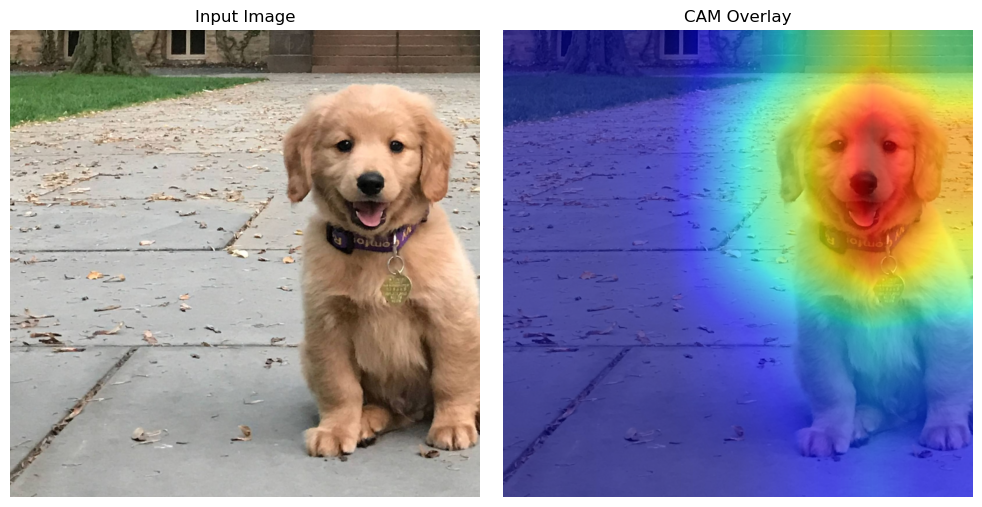

In [3]:
output = model(input_batch)

top1_class_index = torch.argmax(output, dim=1).item()
cam_weights = model.fc.weight[top1_class_index]
cam_heatmap = torch.einsum("c,chw -> hw", cam_weights, last_conv_activations[0])
cam_heatmap = F.interpolate(
    cam_heatmap.unsqueeze(0).unsqueeze(0),
    size=(input_image.size[1], input_image.size[0]),
    mode="bilinear",
).squeeze().detach().cpu().numpy()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title("Input Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(input_image)
plt.imshow(cam_heatmap, cmap='jet', alpha=0.6)
plt.title("CAM Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


# GradCAM

In [4]:
# Load a pre-trained VGG model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# use device = xla.device() if you want to use tpu.
model = models.resnet18(pretrained=True).to(device)
# Set the model to evaluation mode
model.eval()

img_path = 'data/left-dog.jpg'
input_image = Image.open(img_path)

# preprocessing for ResNet
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# set the ReLus to inplace = False
for i, (name, layer) in enumerate(model.named_modules()):
  if isinstance(layer, nn.ReLU):
    if name == "relu":
      getattr(model, name).inplace = False
    else:
      block, num, module = name.split(".")
      getattr(getattr(model,block)[int(num)], 'relu').inplace = False

# preprocess the image
input_tensor = preprocess(input_image)
# create a mini-batch as expected by the model
input_batch = input_tensor.unsqueeze(0)

################################################################################

gradcam_activation = {}

def get_activation(hook_name):
    def hook(module, input, output):
        gradcam_activation[hook_name] = output.detach()
    return hook

# attach the hook to a given layer and save the reference to it in "handle_activation"
layer_number = "last"
last_conv_layer = model.layer4[-1]
hook_handle = last_conv_layer.register_forward_hook(get_activation(layer_number))

# trigger the forward pass
output = model(input_batch)

hook_handle.remove()

gradcam_last_conv_activations = gradcam_activation["last"]

print(input_batch.shape)
print(gradcam_last_conv_activations.shape)


gradcam_gradients = {}
def get_gradients(name):
    def hook(module, grad_input, grad_output):
        gradcam_gradients[name] = grad_output[0]
    return hook

last_conv_layer = model.layer4[-1]
backward_hook_handle = last_conv_layer.register_backward_hook(get_gradients("last"))

output = model(input_batch)
top1_class_index = torch.argmax(output, dim=1).item()
model.zero_grad()
output[0, top1_class_index].backward()

backward_hook_handle.remove()

grad_last_conv_gradients = gradcam_gradients["last"].squeeze()



torch.Size([1, 3, 224, 224])
torch.Size([1, 512, 7, 7])


/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


### Compute the GradCAM weights $ \{\alpha_i\}_{i \in [512]} $ for the top-1 predicted class.


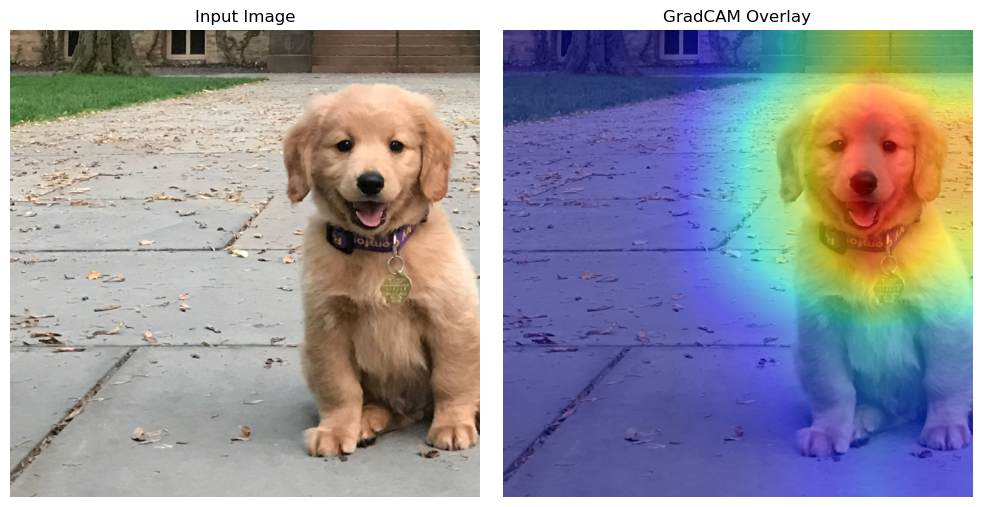

In [5]:
alpha = torch.mean(grad_last_conv_gradients, dim=(1,2))
gradcam_weights = torch.relu(torch.sum(alpha[:, None, None] * gradcam_last_conv_activations.squeeze(), dim=0))

gradcam_heatmap = torch.nn.functional.interpolate(
    gradcam_weights.unsqueeze(0).unsqueeze(0),
    size=(input_image.size[1], input_image.size[0]),
    mode="bilinear",
).squeeze().detach().cpu().numpy()



plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.imshow(input_image, cmap='jet', alpha=0.5)
plt.title("Input Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(input_image)
plt.imshow(gradcam_heatmap, cmap='jet', alpha=0.5)
plt.title("GradCAM Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


Both methods end up computing essentially the **same** heatmap because, in a simple linear‐classification head, the “importance weights” you extract from the gradients are proportional to the actual final‐layer weights.

1. **CAM (Class Activation Mapping)**
   In the original CAM formulation, for a class $c$, you directly use the learned weights $w_v^c$ of the final fully‐connected layer $\mathcal{F}$.  Here we index the post‐ReLU activations by $B\in\R^{V\times h\times w}$, so

   $$
   L_{\mathrm{CAM}}^c(i,j)
   \;=\;\mathrm{ReLU}\Bigl(\sum_{v=1}^{V} w_v^c\;B^v_{\,i,j}\Bigr),
   $$

   where $v$ runs over the $V$ feature maps.

2. **GradCAM**
   GradCAM computes weights by global‐pooling the gradients of the class score $y_c\in\R$ with respect to each activation map:

   $$
   \alpha_v^c 
   = \frac{1}{Z}\sum_{i=1}^{h}\sum_{j=1}^{w}\frac{\partial y_c}{\partial B^v_{\,i,j}},
   $$

   and then forms the heatmap as

   $$
   L_{\mathrm{GradCAM}}^c(i,j)
   = \mathrm{ReLU}\Bigl(\sum_{v=1}^V \alpha_v^c\;B^v_{\,i,j}\Bigr).
   $$

3. **Why they match**
   Recall the forward pass:

   $$
     \xi \xrightarrow{g} A \;\xrightarrow{\mathrm{ReLU}}\; B 
     \;\xrightarrow{\mathrm{GAP}}\; C 
     \;\xrightarrow{\mathrm{flatten}}\; C' 
     \;\xrightarrow{\mathcal{F}}\; y_c.
   $$

   Concretely, after ReLU we have $B^v\in\R^{h\times w}$.  Global average pooling produces

   $$
     C'_v = \frac{1}{Z}\sum_{i,j} B^v_{\,i,j},
     \quad Z = h\cdot w,
   $$

   and the fully‐connected layer gives

   $$
     y_c = \sum_{v=1}^V w_v^c\,C'_v \;+\; b_c.
   $$

   By the chain rule,

   $$
     \frac{\partial y_c}{\partial B^v_{\,i,j}}
     = w_v^c \times \frac{\partial C'_v}{\partial B^v_{\,i,j}}
     = w_v^c \times \frac{1}{Z},
   $$

   so

   $$
     \alpha_v^c
     = \frac{1}{Z}\sum_{i,j}\frac{\partial y_c}{\partial B^v_{\,i,j}}
     = \frac{1}{Z}\sum_{i,j}\frac{w_v^c}{Z}
     \;\propto\; w_v^c.
   $$

   Up to the constant $\tfrac{1}{Z^2}$, GradCAM’s $\alpha_v^c$ are identical to the CAM weights $w_v^c$.  After applying ReLU and any normalization, the **resulting heatmaps coincide**.


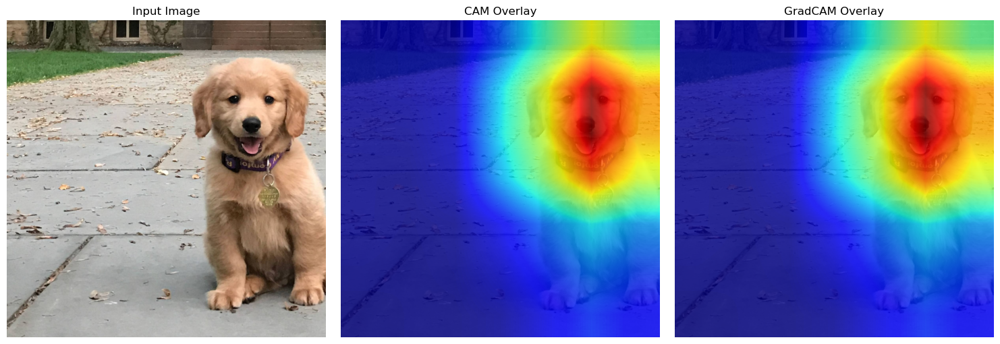

In [6]:

fig, axes = plt.subplots(1, 3, figsize=(15, 5))


axes[0].imshow(input_image)
axes[0].set_title("Input Image")
axes[0].axis("off")


im1 = axes[1].imshow(input_image)
im2 = axes[1].imshow(cam_heatmap, cmap='jet', alpha=0.8,
                     interpolation='nearest', rasterized=True)
axes[1].set_title("CAM Overlay")
axes[1].axis("off")


im3 = axes[2].imshow(input_image)
im4 = axes[2].imshow(gradcam_heatmap, cmap='jet', alpha=0.8,
                     interpolation='nearest', rasterized=True)
axes[2].set_title("GradCAM Overlay")
axes[2].axis("off")

plt.tight_layout()
plt.savefig("gradcam_cam_comparison.pdf",
            format="pdf",
            dpi=300,
            bbox_inches="tight")
plt.show()


# Selecting the right activation weights

In [7]:
from ipywidgets import SelectMultiple, VBox, Output
from IPython.display import display, clear_output
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


import torch
import numpy as np
from torchvision import models, transforms
from PIL import Image

# 1) Load model & image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True).to(device).eval()
img = Image.open('data/left-dog.jpg')

# 2) Preprocess
pre = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
inp = pre(img).unsqueeze(0).to(device)

# 3) Hook last conv
acts = {}
layer = model.layer4[-1].conv2
h = layer.register_forward_hook(lambda m,i,o: acts.setdefault('A', o.detach().cpu()))
out = model(inp)
h.remove()

# 4) Prepare arrays
activation_maps = torch.relu(acts['A'].squeeze(0)).numpy()   # shape (V, h, w)
pred = out.argmax(dim=1).item()
fc_weights = model.fc.weight[pred].detach().cpu().numpy()   # length V
input_image = img                                             # PIL image


# 1) Compute top-20 channels
means = activation_maps.mean(axis=(1,2))
top_k = 20
top_idxs = np.argsort(means)[-top_k:][::-1]
top_wts  = fc_weights[top_idxs]

# 2) Static bar chart
bar_out = Output()
with bar_out:
    fig, ax = plt.subplots(figsize=(8,3))
    ax.bar(range(top_k), top_wts, tick_label=[str(i) for i in top_idxs])
    ax.set_title("Top-20 FC Weights for Predicted Class")
    ax.set_xlabel("Channel index")
    ax.set_ylabel("Weight $w^c_v$")
    plt.setp(ax.get_xticklabels(), rotation=90)
    plt.tight_layout()
    plt.show()

# 3) Selector + overlay output
selector = SelectMultiple(options=[(f"Ch {i}", i) for i in top_idxs],
                          value=list(top_idxs[:5]),
                          description="Channels", rows=6)
overlay_out = Output()

def update(change):
    sel = list(change['new'])
    with overlay_out:
        clear_output(wait=True)
        if not sel:
            print("Select channels to see overlay.")
            return
        # Combine & normalize
        hm = sum(activation_maps[v] for v in sel)
        hm = np.clip(hm,0,None)
        hm = (hm - hm.min())/(hm.max()-hm.min()+1e-8)
        # Resize & overlay
        hm_img = Image.fromarray((hm*255).astype(np.uint8))\
                      .resize(input_image.size, Image.BILINEAR)
        hm_arr = np.array(hm_img)/255.0
        fig, ax = plt.subplots(figsize=(5,5))
        ax.imshow(input_image)
        ax.imshow(hm_arr, cmap='jet', alpha=0.6)
        ax.set_title(f"Overlay: channels {sel}")
        ax.axis('off')
        plt.show()

selector.observe(update, names='value')

# 4) Display
display(VBox([bar_out, selector, overlay_out]))
update({'new': selector.value})


/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## The importance of RELU and activation weights

GradCAM channel weights (α_v) statistics:
  Mean:   0.0022
  Std:    0.0119
  Min:    -0.0159
  Max:    0.0720
  # negative: 312 / 512

Bottom 10 weights (most negative):
  Channel 430: -0.0159
  Channel 444: -0.0158
  Channel 84: -0.0155
  Channel 35: -0.0145
  Channel 506: -0.0145
  Channel 67: -0.0142
  Channel 274: -0.0139
  Channel 220: -0.0138
  Channel 407: -0.0136
  Channel 412: -0.0134

Top 10 weights (most positive):
  Channel 83: 0.0720
  Channel 280: 0.0698
  Channel 28: 0.0651
  Channel 156: 0.0630
  Channel 242: 0.0601
  Channel 9: 0.0583
  Channel 497: 0.0499
  Channel 21: 0.0470
  Channel 326: 0.0470
  Channel 100: 0.0436


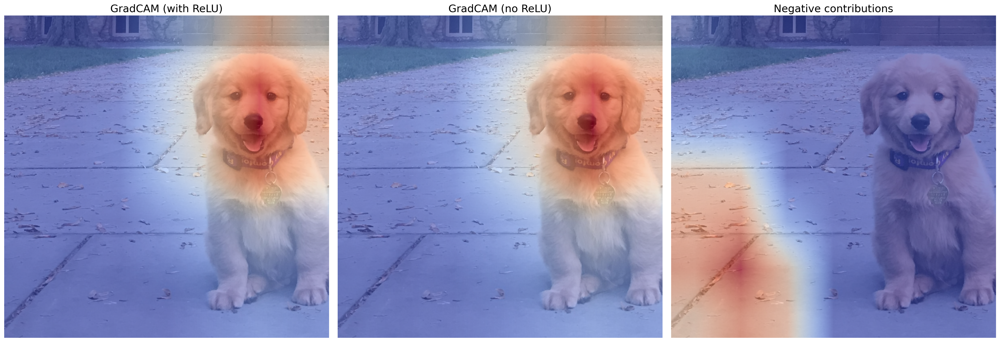

In [22]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image

# 1) Load model & set to eval
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = models.resnet18(pretrained=True).to(device).eval()

# 2) Load and preprocess image
img_path = 'data/left-dog.jpg'
input_image = Image.open(img_path).convert('RGB')
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225]),
])
input_tensor = preprocess(input_image).unsqueeze(0).to(device)

# 3) Hook last conv activations
activations = {}
def forward_hook(module, inp, out):
    activations['A'] = out
last_conv = model.layer4[-1].conv2
last_conv.register_forward_hook(forward_hook)

# 4) Forward pass and compute gradients
output = model(input_tensor)  # keep grad graph
pred_class = output.argmax(dim=1).item()
score = output[0, pred_class]
grads = torch.autograd.grad(score, activations['A'])[0]

# 5) Convert to NumPy
A = activations['A'].squeeze(0).detach().cpu().numpy()  # (V, h, w)
G = grads.squeeze(0).detach().cpu().numpy()              # (V, h, w)

# 6) Compute channel weights α_v
alphas = G.reshape(G.shape[0], -1).mean(axis=1)          # (V,)

# --- Print weight statistics ---
print("GradCAM channel weights (α_v) statistics:")
print(f"  Mean:   {alphas.mean():.4f}")
print(f"  Std:    {alphas.std():.4f}")
print(f"  Min:    {alphas.min():.4f}")
print(f"  Max:    {alphas.max():.4f}")
print(f"  # negative: {(alphas < 0).sum()} / {alphas.size}\n")

sorted_idx = np.argsort(alphas)
print("Bottom 10 weights (most negative):")
for idx in sorted_idx[:10]:
    print(f"  Channel {idx}: {alphas[idx]:.4f}")
print("\nTop 10 weights (most positive):")
for idx in sorted_idx[-10:][::-1]:
    print(f"  Channel {idx}: {alphas[idx]:.4f}")

# 7) Build combined map
combined = np.sum(alphas[:, None, None] * A, axis=0)

# 8) Create variants
map_norelu = combined.copy()          
map_relu   = np.clip(combined, 0, None)   # with final ReLU    # no ReLU
map_neg    = np.clip(-combined, 0, None)  # negative contributions only

# 9) Normalize helper
def normalize(h):
    h = h - h.min()
    return h / (h.max() + 1e-8)

hm_relu   = normalize(map_relu)
hm_norelu = normalize(map_norelu)
hm_neg    = normalize(map_neg)

# 10) Upscale everything
scale = 2
W, H = input_image.size
W2, H2 = W * scale, H * scale
up_img = input_image.resize((W2, H2), Image.BILINEAR)

def resize(h):
    img = Image.fromarray((h * 255).astype(np.uint8))
    return np.array(img.resize((W2, H2), Image.BILINEAR)) / 255.0

hm1 = resize(hm_relu)
hm2 = resize(hm_norelu)
hm3 = resize(hm_neg)

# 11) Plot side by side
fig, axs = plt.subplots(1, 3, figsize=(24, 8), dpi=200)
titles = ["GradCAM (with ReLU)", "GradCAM (no ReLU)", "Negative contributions"]
for ax, hm, title in zip(axs, [hm1, hm2, hm3], titles):
    ax.imshow(up_img)
    ax.imshow(hm, cmap='coolwarm', alpha=0.6, interpolation='nearest', rasterized=True)
    ax.set_title(title, fontsize=18)
    ax.axis('off')

plt.tight_layout()
plt.show()


(array([5., 5., 4., 5., 0., 4., 1., 1., 1., 2., 0., 1., 1., 0., 2., 1., 1.,
        0., 0., 3., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 1., 1., 0.,
        1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 2.]),
 array([-0.05616701, -0.03825886, -0.02035072, -0.00244257,  0.01546558,
         0.03337373,  0.05128188,  0.06919003,  0.08709817,  0.10500632,
         0.12291446,  0.14082262,  0.15873076,  0.17663892,  0.19454706,
         0.2124552 ,  0.23036335,  0.2482715 ,  0.26617965,  0.28408781,
         0.30199593,  0.31990409,  0.33781224,  0.35572037,  0.37362853,
         0.39153668,  0.40944484,  0.42735296,  0.44526112,  0.46316928,
         0.48107743,  0.49898556,  0.51689368,  0.53480184,  0.55271   ,
         0.57061815,  0.58852631,  0.60643446,  0.62434262,  0.64225078,
         0.66015887,  0.67806703,  0.69597518,  0.71388334,  0.7317915 ,
         0.74969965,  0.76760781,  0.7855159 ,  0.80342406,  0.82133222,
         0.83924037]),
 <BarContainer object

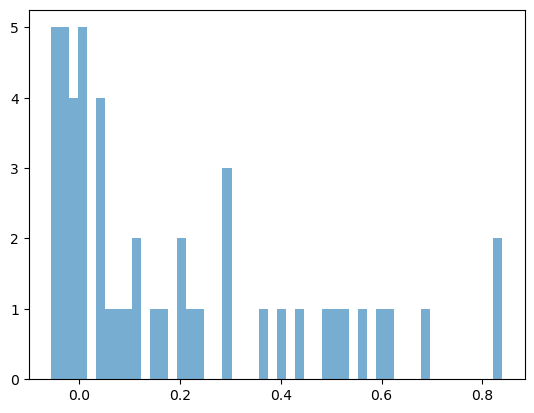

In [17]:
plt.hist(combined.flatten(), bins= 50, alpha=0.6)

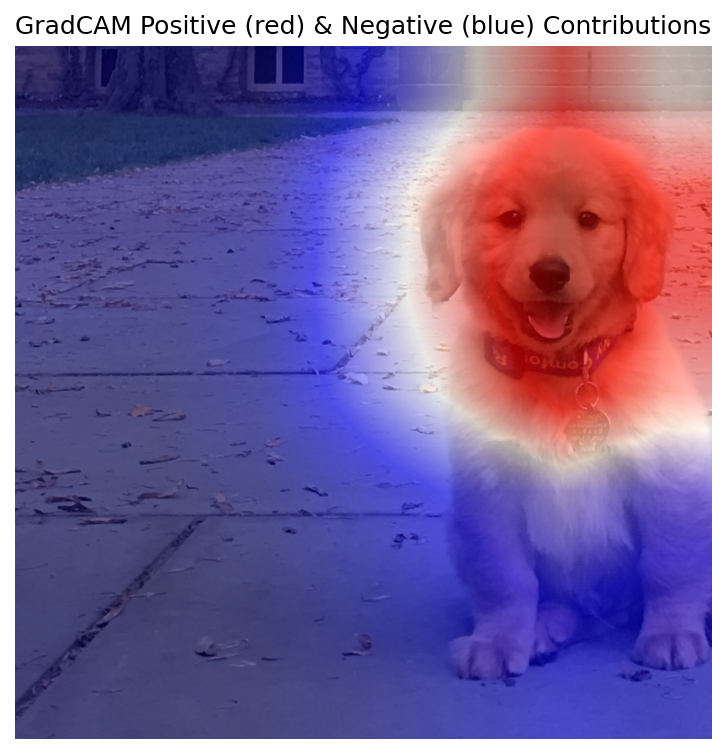

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1) Normalize combined map to [-1,1]
min_val, max_val = combined.min(), combined.max()
combined_norm = (combined - min_val) / (max_val - min_val)  # scaled [0,1]
combined_div  = combined_norm * 2 - 1                        # now in [-1,1]

# 2) Resize to match input image
W, H      = input_image.size
up_img    = input_image.resize((W, H), Image.BILINEAR)
div_map   = Image.fromarray(((combined_div + 1) * 127.5).astype(np.uint8))
div_arr   = np.array(div_map.resize((W, H), Image.BILINEAR)) / 127.5 - 1

# 3) Plot with a diverging colormap
plt.figure(figsize=(6, 6), dpi=150)
plt.imshow(up_img)
plt.imshow(div_arr, cmap='seismic', alpha=0.6, vmin=-1, vmax=1)
plt.title("GradCAM Positive (red) & Negative (blue) Contributions")
plt.axis('off')
plt.show()


## The Class-Specifity of the Actiavtion Weights

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import random

# 1) Load model & image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True).to(device)
model.eval()

img_path = 'data/left-dog.jpg'
input_image = Image.open(img_path).convert("RGB")

# 2) Preprocess
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image).unsqueeze(0).to(device)

# 3) Disable inplace ReLUs
for layer in model.modules():
    if isinstance(layer, nn.ReLU):
        layer.inplace = False

# 4) Identify the last conv layer
last_conv = None
for module in model.modules():
    if isinstance(module, nn.Conv2d):
        last_conv = module
assert last_conv is not None

# Helper to run forward+backward for a given class index
def compute_and_plot(cls_idx, filename):
    # containers
    activations = {}
    gradients = {}
    
    # forward hook
    def forward_hook(module, inp, out):
        activations['feat'] = out.detach()
    fwd = last_conv.register_forward_hook(forward_hook)
    
    # backward hook
    def backward_hook(module, grad_in, grad_out):
        gradients['grad'] = grad_out[0].detach()
    bwd = last_conv.register_backward_hook(backward_hook)
    
    # forward + backward
    output = model(input_tensor)
    model.zero_grad()
    output[0, cls_idx].backward()
    
    # remove hooks
    fwd.remove()
    bwd.remove()
    
    # get feature maps and grads
    feats = activations['feat'].squeeze(0)   # [C,H,W]
    grads = gradients['grad'].squeeze(0)     # [C,H,W]
    
    # compute weights & select top-5 channels
    weights = F.relu(grads.mean(dim=(1,2)))
    top5 = torch.topk(weights, 5).indices
    
    # plot
    fig, axes = plt.subplots(1, 5, figsize=(15, 3))
    for i, ch in enumerate(top5):
        cam = F.interpolate(
            feats[ch][None,None],
            size=input_image.size[::-1],
            mode='bilinear',
            align_corners=False
        ).squeeze().cpu().numpy()
        axes[i].imshow(input_image)
        axes[i].imshow(
            cam,
            cmap='jet',        # more intense than 'jet'
            alpha=0.7,         # stronger overlay
            vmin=0,            # stretch from zero
            vmax=cam.max()     # to the channel's max
        )
        axes[i].set_title(f"Ch #{ch.item()}")
        axes[i].axis('off')
    plt.tight_layout()
    fig.savefig(
        filename,
        format="pdf",
        dpi=300,
        bbox_inches="tight"
    )
    plt.close(fig)

    # <-- NEW: print which class this file corresponds to
    print(f"Saved {filename} for class index {cls_idx}")

# 5) Determine classes
with torch.no_grad():
    out = model(input_tensor)
probs = F.softmax(out, dim=1)[0]
top_class = torch.argmax(probs).item()
rand_class = random.randrange(out.size(1))

# 6) Compute & save
compute_and_plot(top_class,  'top_class_channels.pdf')
compute_and_plot(rand_class, 'random_class_channels.pdf')


/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Saved top_class_channels.pdf for class index 207


/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Saved random_class_channels.pdf for class index 952


## Snaity Check: Randomizing the model

In [11]:
# Load a pre-trained VGG model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# use device = xla.device() if you want to use tpu.
model = models.resnet18(pretrained=True).to(device)
# Set the model to evaluation mode
model.eval()

img_path = 'data/left-dog.jpg'
input_image = Image.open(img_path)

# preprocessing for ResNet
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# set the ReLus to inplace = False
for i, (name, layer) in enumerate(model.named_modules()):
  if isinstance(layer, nn.ReLU):
    if name == "relu":
      getattr(model, name).inplace = False
    else:
      block, num, module = name.split(".")
      getattr(getattr(model,block)[int(num)], 'relu').inplace = False


# preprocess the image
input_tensor = preprocess(input_image)
# create a mini-batch as expected by the model
input_batch = input_tensor.unsqueeze(0)

################################################################################

for layer in model.modules():
    if isinstance(layer, nn.Conv2d):
        nn.init.kaiming_normal_(layer.weight, mode='fan_out', nonlinearity='relu')
        if layer.bias is not None:
            nn.init.zeros_(layer.bias)
    elif isinstance(layer, nn.Linear):
        nn.init.kaiming_normal_(layer.weight, mode='fan_out', nonlinearity='relu')
        nn.init.zeros_(layer.bias)
    elif isinstance(layer, nn.BatchNorm2d):
        nn.init.ones_(layer.weight)
        nn.init.zeros_(layer.bias)

# # # # # # # # # ## # ## # # # # # # # # # # #

# reregister hooks

new_activation = {}

def get_activation(hook_name):
    def hook(module, input, output):
        new_activation[hook_name] = output.detach()
    return hook

# attach the hook to a given layer and save the reference to it in "handle_activation"
last_conv_layer = model.layer4[-1]
new_hook_handle = last_conv_layer.register_forward_hook(get_activation("last"))

# trigger the forward pass
output = model(input_batch)


new_last_conv_activations = new_activation["last"]

new_gradients = {}
def get_gradients(name):
    def hook(module, grad_input, grad_output):
        new_gradients[name] = grad_output[0]
    return hook

new_backward_hook_handle = last_conv_layer.register_backward_hook(get_gradients("last"))

output = model(input_batch)
top1_class_index = torch.argmax(output, dim=1).item()
model.zero_grad()
output[0, top1_class_index].backward()

new_last_conv_gradients = new_gradients["last"].squeeze()
print(grad_last_conv_gradients.shape)

new_hook_handle.remove()
new_backward_hook_handle.remove()

/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/Users/juliawenkmann/miniconda3/envs/ml/lib/python3.11/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full

torch.Size([512, 7, 7])


### Cmparison of the GradCAM heatmaps of the trained model and the randomized model. 

49


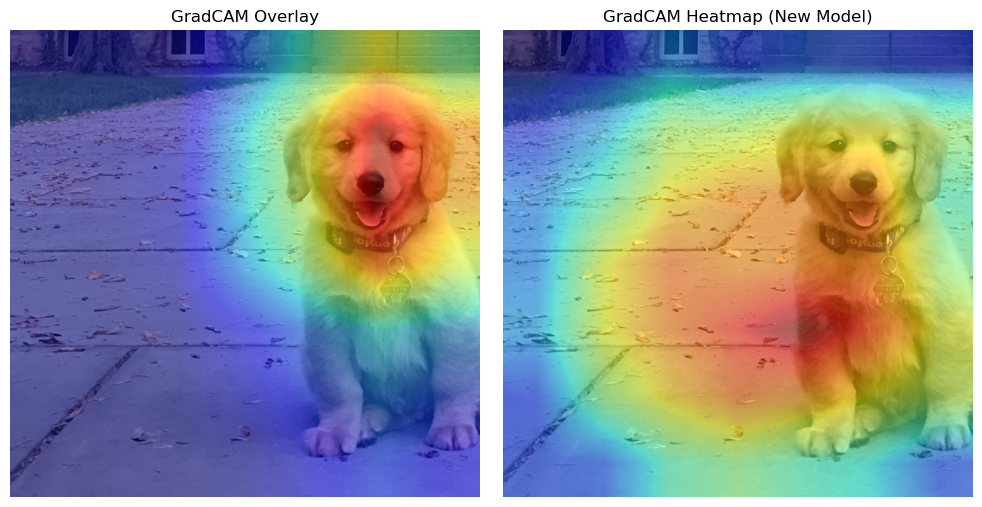

In [12]:
output_new = model(input_batch)
top1_class_index_new = torch.argmax(output_new, dim=1).item()
print(top1_class_index_new)


model.zero_grad()
output_new[0, top1_class_index_new].backward()



alpha_new = torch.mean(new_last_conv_gradients.squeeze(), dim=(1, 2))
cam_weights_new = torch.relu(torch.sum(alpha_new[:, None, None] * new_last_conv_activations[0], dim=0))

gradcam_heatmap_new = torch.nn.functional.interpolate(
    cam_weights_new.unsqueeze(0).unsqueeze(0),
    size=(input_image.size[1], input_image.size[0]),
    mode="bilinear",
    align_corners=False
).squeeze().detach().cpu().numpy()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.imshow(gradcam_heatmap, cmap='jet', alpha=0.5)
plt.title("GradCAM Overlay")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(input_image)
plt.imshow(gradcam_heatmap_new, cmap='jet', alpha=0.5)
plt.title("GradCAM Heatmap (New Model)")
plt.axis("off")

plt.tight_layout()
plt.show()
